## Dataset Information

The training archive contains 25,000 images of dogs and cats. Train your algorithm on these files and predict the labels

(1 = dog, 0 = cat).

## Download Dataset

In [1]:
# !wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip

## Unzip the Dataset

In [2]:
# !unzip kagglecatsanddogs_3367a.zip

## Import Modules

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

## Create Dataframe for Input and Output

In [4]:
input_path = []
label = []

for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/"+class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PetImages", class_name, path))
print(input_path[0], label[0])

PetImages\Cat\0.jpg 0


In [5]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages\Dog\11494.jpg,1
1,PetImages\Dog\8839.jpg,1
2,PetImages\Cat\1742.jpg,0
3,PetImages\Cat\7536.jpg,0
4,PetImages\Dog\9024.jpg,1


In [6]:
for i in df['images']:
    if '.jpg' not in i:
        print(i)

In [7]:
import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)
l

[]

In [8]:
# delete db files
df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']
len(df)

24971

## Exploratory Data Analysis

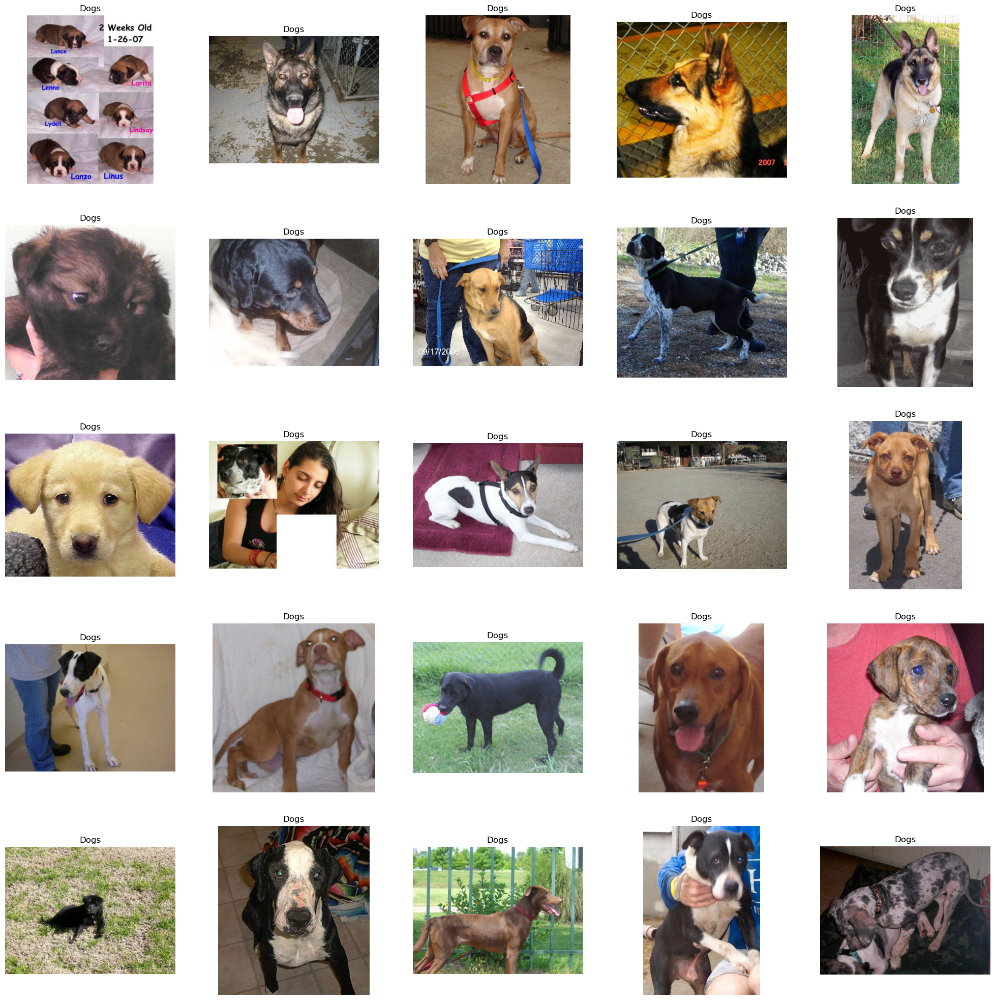

In [9]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

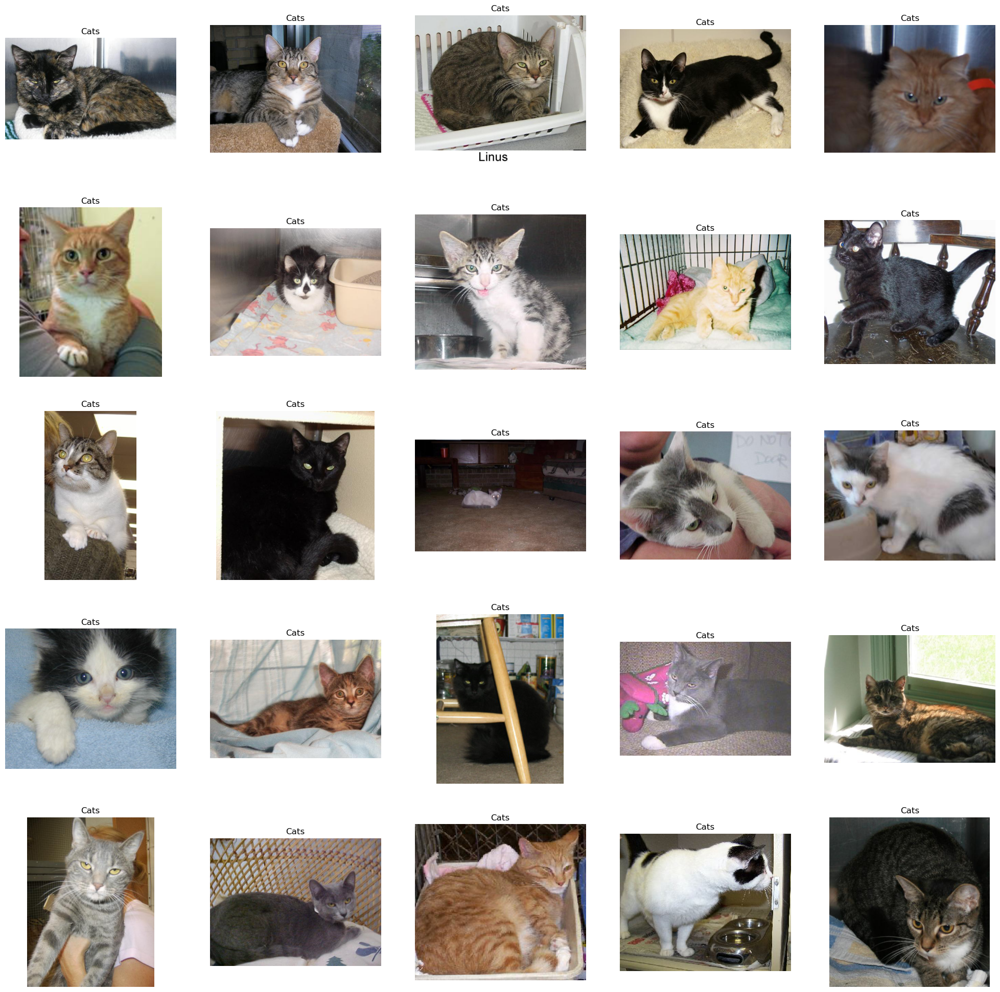

In [10]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

<Axes: ylabel='count'>

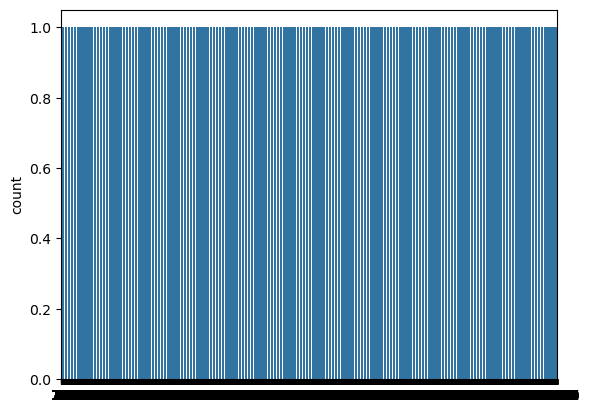

In [11]:
import seaborn as sns
sns.countplot(df['label'])

## Create DataGenerator for the Images

In [12]:
df['label'] = df['label'].astype('str')

In [13]:
df.head()

,images,label
0,PetImages\Dog\11494.jpg,1
1,PetImages\Dog\8839.jpg,1
2,PetImages\Cat\1742.jpg,0
3,PetImages\Cat\7536.jpg,0
4,PetImages\Dog\9024.jpg,1


In [14]:
# input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [15]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 40, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train, 
    x_col='images', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=512, 
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test, 
    x_col='images', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=512, 
    class_mode='binary'
)

Found 19976 validated image filenames belonging to 2 classes.
Found 4995 validated image filenames belonging to 2 classes.


## Model Creation

In [16]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model = Sequential([
                    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
                    MaxPool2D((2,2)),
                    Conv2D(32, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Conv2D(64, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Flatten(),
                    Dense(512, activation='relu'),
                    Dense(1, activation='sigmoid')
])

In [17]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     6,423,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,447,137 (24.59 MB)

 Trainable params: 6,447,137 (24.59 MB)

 Non-trainable params: 0 (0.00 B)

In [18]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 262s 6s/step - accuracy: 0.5100 - loss: 0.8286 - val_accuracy: 0.5980 - val_loss: 0.6640
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 225s 6s/step - accuracy: 0.6051 - loss: 0.6572 - val_accuracy: 0.6573 - val_loss: 0.6128
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 207s 5s/step - accuracy: 0.6779 - loss: 0.6012 - val_accuracy: 0.7173 - val_loss: 0.5664
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 202s 5s/step - accuracy: 0.7005 - loss: 0.5744 - val_accuracy: 0.7071 - val_loss: 0.5634
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 196s 5s/step - accuracy: 0.7196 - loss: 0.5461 - val_accuracy: 0.7391 - val_loss: 0.5178
Epoch 6/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 197s 5s/step - accuracy: 0.7289 - loss: 0.5427 - val_accuracy: 0.7427 - val_loss: 0.5149
Epoch 7/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 234s 6s/step - accuracy: 0.7277 - loss: 0.5404 - val_accuracy: 0.7644 - val_loss: 0.4883
Epoch 8/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 198s 5s/step - accuracy: 0.7519 - loss: 0.5069 - val_accuracy: 0.7059 - v

## Visualization of Results

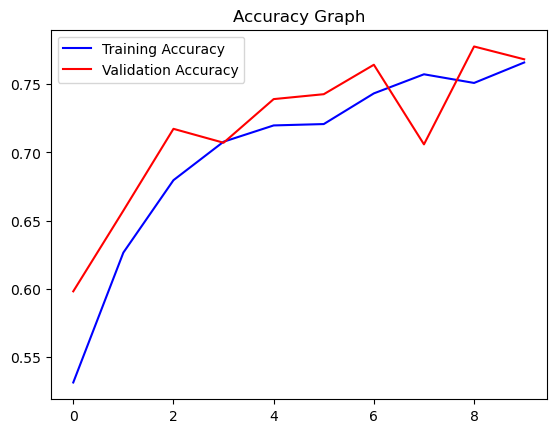

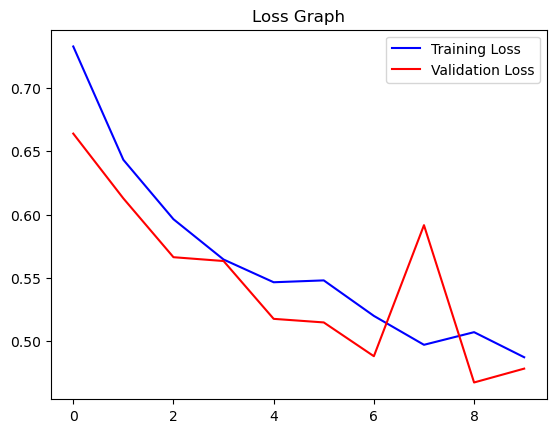

In [19]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

## Test with Real Image

In [29]:
image_path = r"C:\Users\Eng. Ramez\Desktop\Screenshot 2025-05-13 052803.png" # path of the image
img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1, 128, 128, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(label)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Cat


In [31]:
model.save("model.h5")


In [37]:
import streamlit as st
import numpy as np
from keras.preprocessing.image import load_img
from keras.models import load_model

import matplotlib.pyplot as plt

# Load the trained model
model = load_model('model.h5')  # Replace with the path to your saved model

# Streamlit app
st.title("Dog vs Cat Classifier")

# Upload image
uploaded_file = st.file_uploader("Upload an image", type=["jpg", "png", "jpeg"])

if uploaded_file is not None:
    # Display the uploaded image
    st.image(uploaded_file, caption="Uploaded Image", use_column_width=True)
    
    # Preprocess the image
    img = load_img(uploaded_file, target_size=(128, 128))
    img_array = np.array(img) / 255.0  # Normalize the image
    img_array = img_array.reshape(1, 128, 128, 3)  # Reshape for prediction

    # Make prediction
    pred = model.predict(img_array)
    label = "Dog" if pred[0] > 0.5 else "Cat"
    
    # Display the result
    st.write(f"Prediction: {label}")
    
    # Optionally, display the confidence score
    st.write(f"Confidence: {pred[0][0]:.2f}")

In [36]:
!streamlit run app.py 

^C
